In [112]:
import xarray as xr 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import dask.array as da
from dask import delayed, compute
from dask.diagnostics import ProgressBar
import os
from helper import concatenate_images2
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from skimage.measure import label
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import ListedColormap
import json
import cmocean


### Exploring the angular dependcy of VELOX brightness temperatures

<xarray.Dataset>
Dimensions:       (band: 5, time: 121, x: 635, y: 507)
Coordinates:
  * time          (time) datetime64[ns] 2022-03-20T10:51:30 ... 2022-03-20T10...
Dimensions without coordinates: band, x, y
Data variables: (12/13)
    BT_2D         (band, time, x, y) float32 -34.87 -34.88 ... -31.87 -30.98
    BT_Center     (band, time) float32 -36.8 -36.92 -36.98 ... -37.6 -37.56
    alt           (band, time) float32 1.173e+04 1.173e+04 ... 1.173e+04
    lat           (band, time) float32 78.67 78.68 78.68 ... 78.93 78.93 78.93
    lon           (band, time) float32 -14.33 -14.33 -14.32 ... -13.8 -13.8
    yaw           (band, time) float32 18.76 18.79 18.8 ... 19.47 19.48 19.5
    ...            ...
    BT_5          (time, x, y) float32 -35.16 -35.83 -35.2 ... -33.51 -34.31
    BT_6          (time, x, y) float32 -38.08 -38.64 -36.99 ... -31.87 -30.98
    BT_2          (time, x, y) float32 -36.55 -35.97 -35.97 ... -26.58 -31.18
    BT_3          (time, x, y) float32 -38.97 -42.81 -41.77 ... -30.12 -26.39
    BT_4          (time, x, y) float32 -35.16 -35.83 -35.2 ... -33.51 -34.31
    BT_1          (time, x, y) float32 -34.87 -34.88 -35.03 ... -31.72 -32.47
Attributes: (12/21)
    Conventions:             "CF-1.8"
    author:                  Michael Schäfer, Sophie Rosenburg, André Ehrlich...
    campaign:                HALO-AC3
    comment_1:               Band wavelength range: 7.70 - 12.00 micrometers
    comment_2:               Flight direction is towards positive y-direction...
    comment_3:               Thermal infrared imager information: focal lengt...
    ...                      ...
    research_flight_day:     20220320
    research_flight_number:  RF07
    source:                  Airborne imaging with the VELOX system
    title:                   Two-dimensional cloud-top or surface brightness ...
    variable:                BT_2D, BT_Center
    version:                 Version v3.0 from 2023-09-11

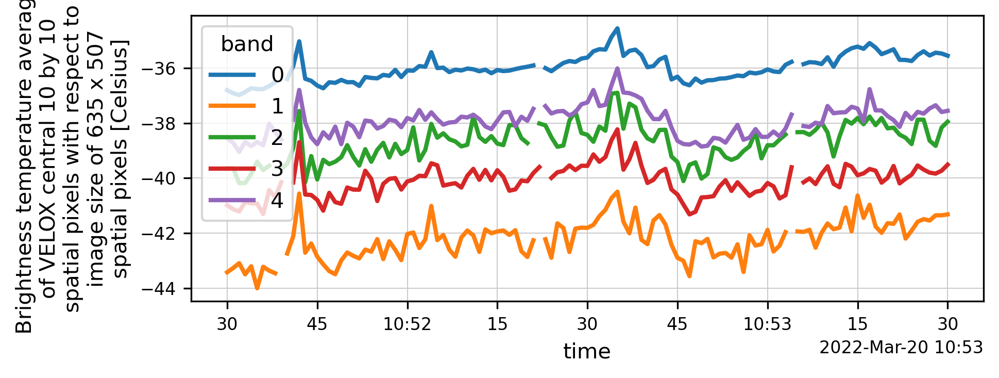

In [113]:
ds_raw = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/Mueller_et_al_2024/data/predicted/pushbroom/v_0.2/2022-04-04T13:19:30_2022-04-04T13:40:00.nc', engine='h5netcdf')
ds_raw['quality_flag'] = ds_raw.BT_1.isnull().sum(dim=('x', 'y')) == 0 

# ds_processed = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/Mueller_et_al_2024/data/predicted/pushbroom_to_publish/v_0.2/2022-03-20T13:19:30_2022-04-04T13:40:00.nc', engine='h5netcdf')
# ds_processed['quality_flag'] = ds_processed.skin_t.isnull().sum(dim=('x', 'y')) == 0

ds_raw_bt = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/HALO-AC3_VELOX_sea_ice/2022-03-20_v_0.1.zarr', engine='zarr')
ds_raw_sel = ds_raw_bt.sel(time=slice('2022-03-20T10:51:30', '2022-03-20T10:53:30'))
ds_raw_sel.BT_Center.plot(hue='band')
ds_raw_sel['quality_flag'] = ds_raw_sel.BT_2D.isel(band=0).isnull().sum(dim=('x', 'y')) == 0
ds_nav = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/HALO-AC3_unified_data/unified_gps_new.nc')
ds_raw_sel['BT_5'] = ds_raw_sel.isel(band=3).BT_2D
ds_raw_sel['BT_6'] = ds_raw_sel.isel(band=4).BT_2D
ds_raw_sel['BT_2'] = ds_raw_sel.isel(band=1).BT_2D
ds_raw_sel['BT_3'] = ds_raw_sel.isel(band=2).BT_2D
ds_raw_sel['BT_4'] = ds_raw_sel.isel(band=3).BT_2D
ds_raw_sel['BT_1'] = ds_raw_sel.isel(band=0).BT_2D

ds_raw_sel.load()

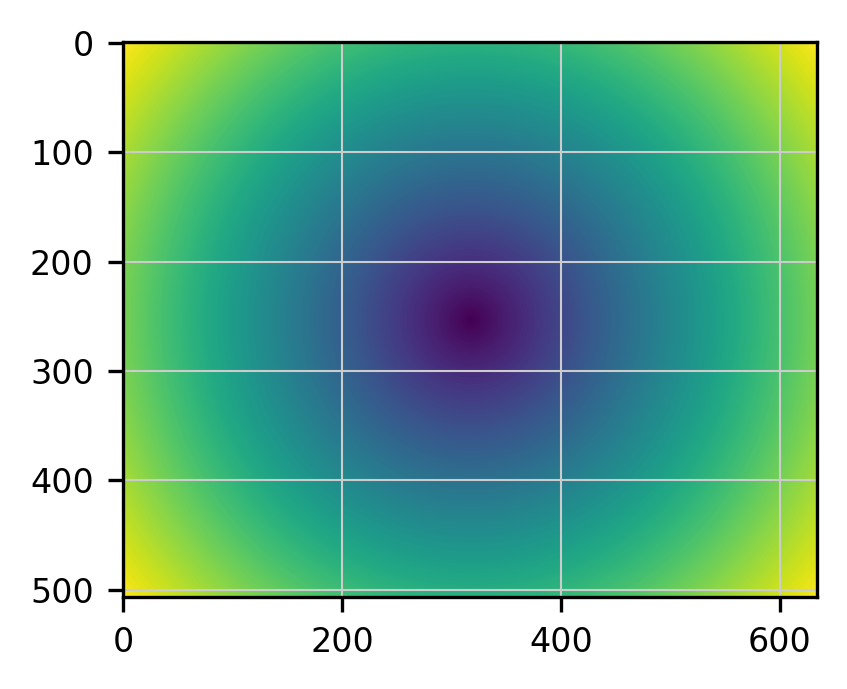

In [114]:
nav = ds_nav.sel(time=ds_raw_sel.time).mean(dim='time')

from helper import pixel_to_meter

x, y = pixel_to_meter(nav['pitch'], nav['roll'], nav['alt'])

### calculate the viewing zenith angle 

# Calculate the viewing zenith angle (VZA)
image_center_x = 635 / 2
image_center_y = 507 / 2

# Assuming the altitude is in meters and the pixel size is 10 meters
pixel_size = 10
altitude = nav['alt'].values

# Calculate the distance from the center of the image to each pixel
distance_x = (np.arange(635) - image_center_x) * pixel_size
distance_y = (np.arange(507) - image_center_y) * pixel_size

# Create a meshgrid for the distances
distance_xx, distance_yy = np.meshgrid(distance_x, distance_y)

# Calculate the viewing zenith angle
vza = np.degrees(np.arctan(np.sqrt(distance_xx**2 + distance_yy**2) / altitude))

# Plot the viewing zenith angle

plt.imshow(vza, cmap='viridis')

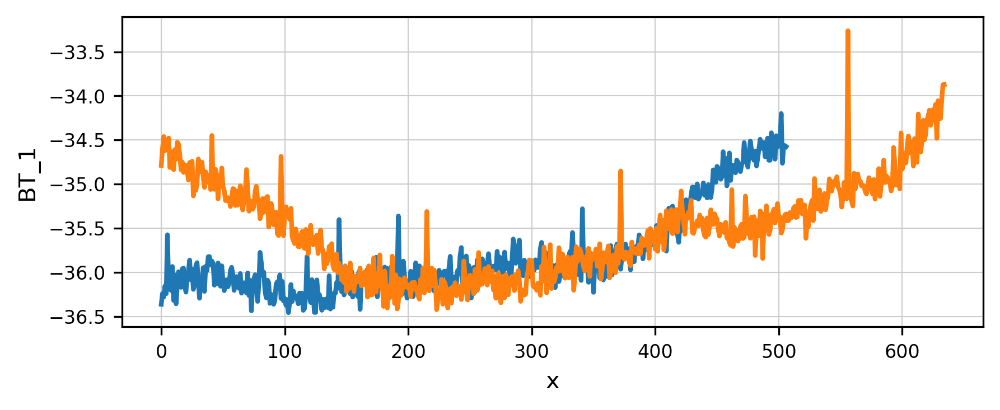

In [115]:
ds_raw_sel['BT_1'].mean(dim='time').isel(x=320).plot()
ds_raw_sel['BT_1'].mean(dim='time').isel(y=253).plot()

0
1
2
3
4
5


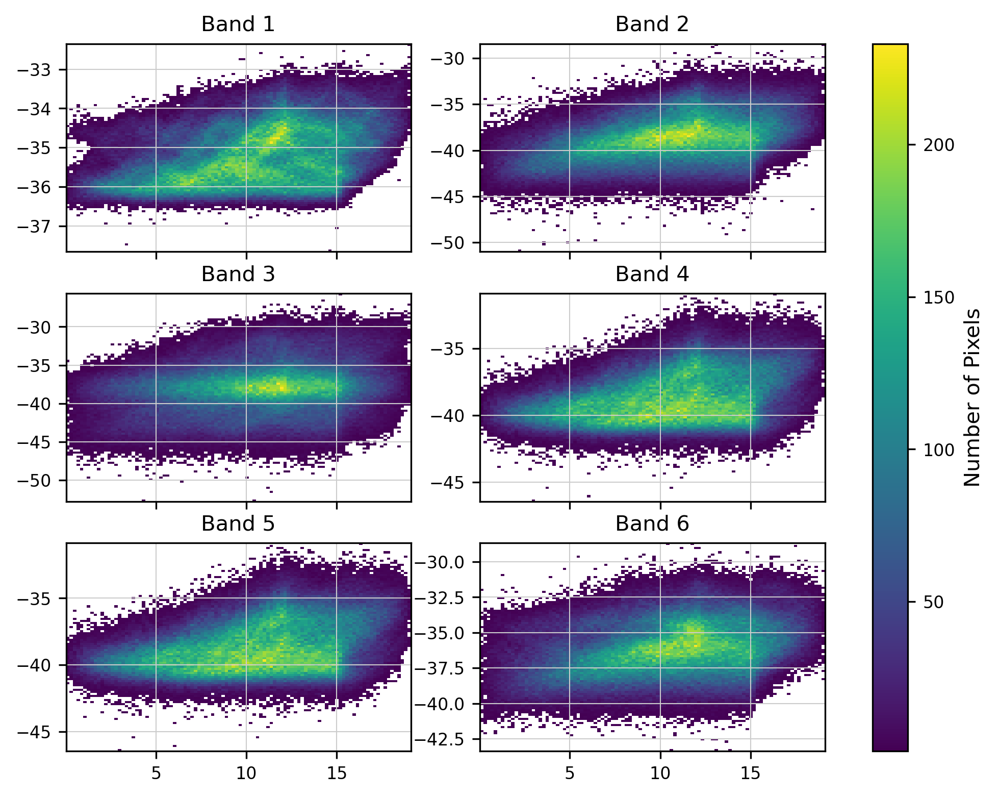

In [116]:
plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))
from matplotlib.colors import LogNorm


fig, ax = plt.subplots(
    3, 2,
    figsize=(8, 6),
    sharex=True,
)


YY = ds_raw_sel['BT_5'].mean(dim='time').values.flatten()
XX = vza.flatten()

axf = ax.flatten()

for i in range(6):
    print(i)
    YY = ds_raw_sel[f'BT_{i+1}'].mean(dim='time').values.flatten()
    h = axf[i].hist2d(XX, YY, bins=100, cmap='viridis', cmin=1)
    axf[i].set_title(f'Band {i+1}')

# h = ax.hist2d(XX, YY, bins=100, cmap='viridis', cmin=1)
# ax.set_ylabel('$T_\mathrm{B,5}$ (K)')
# ax.set_xlabel('Viewing Zenith Angle (°)')


plt.colorbar(h[3], ax=ax, label='Number of Pixels')


In [117]:
def concatenate_images_delayed(ds_sel, slicing_position, variable, quality_flag, pad_size):
    @delayed
    def concatenate_and_pad():
        im = concatenate_images2(ds_sel, slicing_position=slicing_position, variable=variable, quality_flag=quality_flag)
        im = im.astype(np.float32)
        im = np.pad(im, ((0, 0), (slicing_position, 0)), mode='constant', constant_values=np.nan)
        im = np.pad(im, ((0, 0), (0, pad_size)), mode='constant', constant_values=np.nan)
        return im
    
    return concatenate_and_pad()

def average_concat_dask(ds_sel, variable='label', slicing_positions=np.arange(0, 500, 30)):
    quality_flag = ds_sel['quality_flag'].values
    tasks = [concatenate_images_delayed(ds_sel, sp, variable, quality_flag, slicing_positions[-(i+1)])
             for i, sp in enumerate(slicing_positions)]
    with ProgressBar():
        results = compute(*tasks)
    ### check if all images have the same shape and remove the ones that don't

    shapes = [r.shape for r in results]
    if len(set(shapes)) > 1:
        print('Warning: Some images have different shapes')
        results = [r for r in results if r.shape == shapes[0]]

    ds_cc = da.stack(results, axis=0)
    
    return ds_cc
    #return da.nanmedian(ds_cc, axis=0).compute()
bt5 = average_concat_dask(ds_raw_sel, variable='BT_5',slicing_positions=np.arange(0, 500, 10))
bt6 = average_concat_dask(ds_raw_sel, variable='BT_6',slicing_positions=np.arange(0, 500, 10))
bt2 = average_concat_dask(ds_raw_sel, variable='BT_2',slicing_positions=np.arange(0, 500, 10))
bt1 = average_concat_dask(ds_raw_sel, variable='BT_1',slicing_positions=np.arange(0, 500, 10))
bt3 = average_concat_dask(ds_raw_sel, variable='BT_3',slicing_positions=np.arange(0, 500, 10))


[########################################] | 100% Completed | 9.86 ss
[########################################] | 100% Completed | 8.95 ss
[########################################] | 100% Completed | 11.45 s
[########################################] | 100% Completed | 10.30 s
[########################################] | 100% Completed | 8.76 ss


In [118]:
### calcualte the vza for the slicing positions with 10m equals one pixel and 10km flying height
vza = np.arctan(np.arange(-2500, 2500, 100) / 10000) * 180 / np.pi
vza

phi = np.arctan(np.linspace(-3200, 3200, 635) / 10000) * 180 / np.pi


ds_cc = xr.Dataset(
    data_vars=dict(
        BT_5=(['vza','x', 'time'], bt5),
        BT_6=(['vza','x', 'time'], bt6),
        BT_2=(['vza','x', 'time'], bt2),
        BT_1=(['vza','x', 'time'], bt1),
        BT_3=(['vza','x', 'time'], bt3),
    ),
    coords=dict(
        time=np.arange(bt5.shape[2]),
        x=phi, 
        vza=vza[:-1],
    ),
)

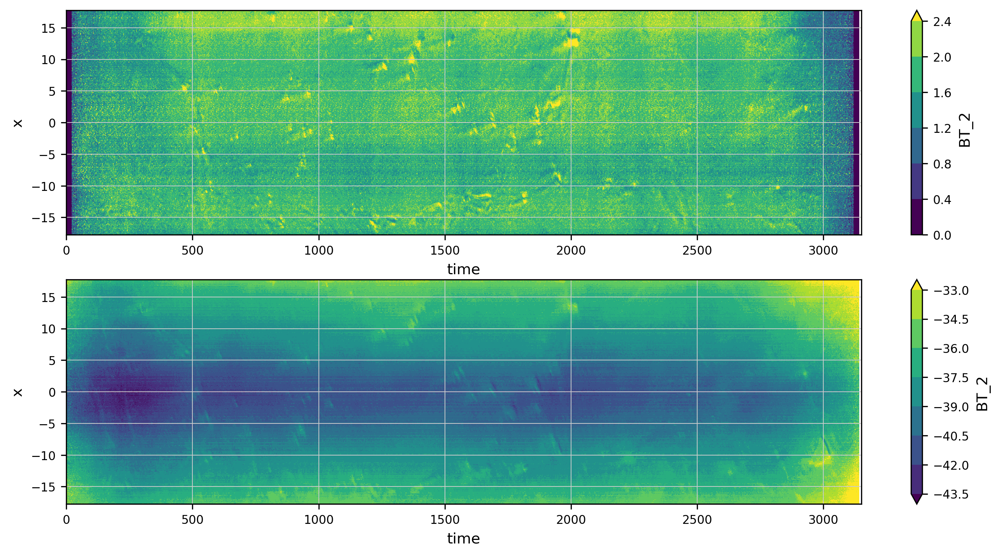

In [119]:
fig, ax = plt.subplots(2, 1, figsize=(12, 6))

ds_cc.BT_2.std(dim='vza').plot.contourf(x='time', y='x', robust=True, ax=ax[0])
ds_cc.BT_2.mean(dim='vza').plot.contourf(x='time', y='x', robust=True, ax=ax[1])

<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:53: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:53: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/1065664578.py:29: SyntaxWarning: invalid escape sequence '\m'
  ax[1,0].set_ylabel('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/1065664578.py:30: SyntaxWarning: invalid escape sequence '\m'
  ax[2,0].set_ylabel('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_2416254/1065664578.py:31: SyntaxWarning: invalid escape sequence '\m'
  ax[3,0].set_ylabel('$T_\mathrm{B,2}$ (K)'

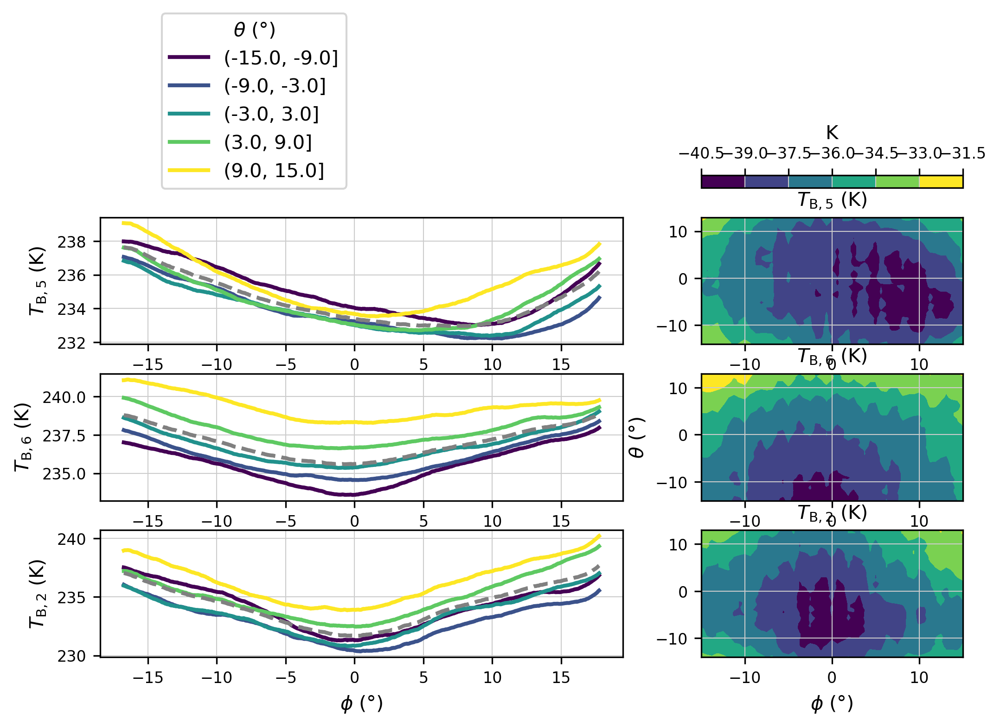

In [120]:
fig, ax = plt.subplots(4, 2, figsize=(8, 4.5),
 gridspec_kw={'width_ratios': [2, 1],
              'height_ratios': [0.1, 1, 1, 1],
              'hspace': 0.3,})


plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

fs = 10
plt.rcParams['font.size'] = fs


ds_gp = ds_cc.groupby_bins('vza', bins=np.linspace(-15, 15, 6)).mean()

for a in ax[:,0]:
    a.set_prop_cycle(color=plt.cm.viridis(np.linspace(0, 1, 5)))
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_5.plot(x='x', hue='vza_bins', ax=ax[1,0],lw=2, add_legend=True)
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_6.plot(x='x', hue='vza_bins', ax=ax[2,0], add_legend=False,  lw=2)
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_2.plot(x='x', hue='vza_bins', ax=ax[3,0], add_legend=False, lw=2)

legend= ax[1,0].get_legend()
(ds_cc.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_5.plot(x='x', color='gray', ax=ax[1, 0], lw=2, ls='--')
(ds_cc.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_6.plot(x='x', color='gray', ax=ax[2, 0], lw=2, ls='--')
(ds_cc.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_2.plot(x='x', color='gray', ax=ax[3, 0], lw=2, ls='--')

legend.set_bbox_to_anchor((0.1, 1.15))
legend.set_title(r'$\theta$ (°)')

ax[1,0].set_ylabel('$T_\mathrm{B,5}$ (K)')
ax[2,0].set_ylabel('$T_\mathrm{B,6}$ (K)')
ax[3,0].set_ylabel('$T_\mathrm{B,2}$ (K)')

ax[1,0].set_xlabel('')
ax[2,0].set_xlabel('')
ax[3,0].set_xlabel(r'$\phi$ (°)')


### calculate the total VZA 
ds_cc.BT_5.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[1, 1], add_colorbar=False)
ds_cc.BT_2.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[3,1], add_colorbar=False)
im = ds_cc.BT_6.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[2,1], add_colorbar=False)

plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

ax[2, 1].set_ylabel(r'$\theta$ (°)')
ax[1, 1].set_ylabel('')    
ax[3, 1].set_ylabel('')
#ax[0].set_xlabel(r'$\phi$ (°)')
# ax[1].set_xlabel(r'$\phi$ (°)')
ax[3, 1].set_xlabel(r'$\phi$ (°)')
ax[1, 1].set_title('$T_\mathrm{B,5}$ (K)')
ax[2, 1].set_title('$T_\mathrm{B,6}$ (K)')
ax[3, 1].set_title('$T_\mathrm{B,2}$ (K)')

ax[0,0].set_visible(False)

### append an axis on the right top to show the colorbar; 



cbar = fig.colorbar(im, cax=ax[0,1], label='K', orientation='horizontal', location='top'),

,mean,std
band,,
0,-35.513206,0.531305
1,-39.612736,1.782640
2,-37.296455,1.297676
3,-39.246025,1.279250
4,-36.424664,1.104072


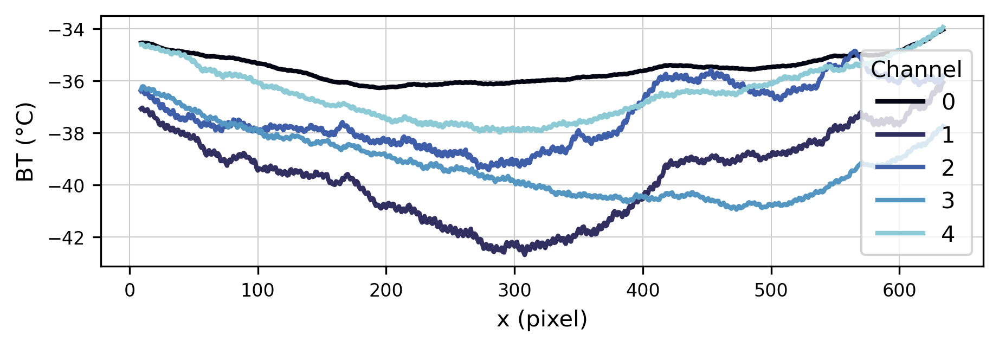

In [124]:
# ds_raw_sel.BT_2D.mean(dim='time').plot(
#     x='x', y='y', cmap='viridis', col='band', col_wrap=3, robust=True,)
import cmocean
fig, ax = plt.subplots(1, 1, figsize=(7, 2))

ax.set_prop_cycle(color=cmocean.cm.ice(np.linspace(0, 1, 6)))

ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').rolling(x=10).mean().plot(
    x='x', hue='band', ax=ax, lw=2)

legend = ax.get_legend()

legend.set_title('Channel')
ax.set_ylabel('BT (°C)')
ax.set_xlabel('x (pixel)')

col2 = ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').std(dim='x').to_dataframe()
col1 = ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').mean(dim='x').to_dataframe()

df = pd.concat([col1, col2], axis=1)
df.columns = ['mean', 'std']
df

In [125]:
ds_gp.std(dim=['time', 'x']).compute().to_dataframe()

,BT_5,BT_6,BT_2,BT_1,BT_3
vza_bins,,,,,
"(-15.0, -9.0]",1.714312,1.420947,2.054474,0.699733,2.158114
"(-9.0, -3.0]",1.592464,1.317319,1.888263,0.665433,1.465741
"(-3.0, 3.0]",1.468420,1.252654,1.984592,0.704996,1.520521
"(3.0, 9.0]",1.679265,1.177660,2.136186,0.740150,2.059616
"(9.0, 15.0]",1.805766,1.059024,2.055869,0.616252,2.394889


<>:20: SyntaxWarning: invalid escape sequence '\m'
<>:21: SyntaxWarning: invalid escape sequence '\m'
<>:20: SyntaxWarning: invalid escape sequence '\m'
<>:21: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/1613247442.py:20: SyntaxWarning: invalid escape sequence '\m'
  ax[0].set_ylabel('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/1613247442.py:21: SyntaxWarning: invalid escape sequence '\m'
  ax[1].set_ylabel('$T_\mathrm{B,6}$ (K)')


Text(0.5, 0, '$\\phi$ (°)')

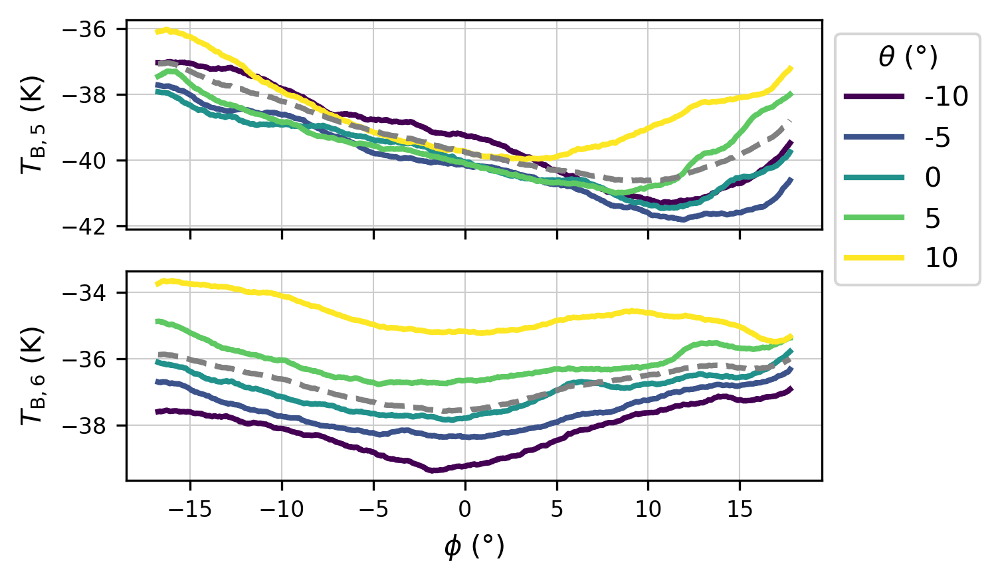

In [126]:
# Calculate the weights
weights = 1 / np.cos(np.radians(phi))

# Apply the weights to the data
fig, ax = plt.subplots(2, 1, figsize=(4.5, 3), sharex=True)

for a in ax:
    a.set_prop_cycle(color=plt.cm.viridis(np.linspace(0, 1, 5)))

(ds_cc.interp(vza=[-10, -5, 0, 5, 10]).mean(dim='time').rolling(x=20).mean() * weights).BT_5.plot(x='x', hue='vza', ax=ax[0], lw=2, add_legend=True)
(ds_cc.interp(vza=[-10, -5, 0, 5, 10]).mean(dim='time').rolling(x=20).mean() * weights).BT_6.plot(x='x', hue='vza', ax=ax[1], add_legend=False, lw=2)

legend = ax[0].get_legend()
(ds_cc.mean(dim=['time', 'vza']).rolling(x=20).mean() * weights).BT_5.plot(x='x', color='gray', ax=ax[0], lw=2, ls='--')
(ds_cc.mean(dim=['time', 'vza']).rolling(x=20).mean() * weights).BT_6.plot(x='x', color='gray', ax=ax[1], lw=2, ls='--')

legend.set_bbox_to_anchor((1, 1))
legend.set_title(r'$\theta$ (°)')

ax[0].set_ylabel('$T_\mathrm{B,5}$ (K)')
ax[1].set_ylabel('$T_\mathrm{B,6}$ (K)')

ax[0].set_xlabel('')
ax[1].set_xlabel(r'$\phi$ (°)')

In [129]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you already calculated vza_ as below:
vza = (ds.vza**2 + ds.x**2)**.5

# Stack the dataset along the new 'vza_' coordinate
ds_vza = ds.stack(vza_=('vza', 'x'))
ds_vza = ds_vza.drop_vars('vza')  # Drop the original 'vza' coordinate
ds_vza['vza_'] = (('vza_'), vza.values.flatten())  # Assign flattened vza values
# Create the plot
fig, ax = plt.subplots(3, 1, figsize=(4.5, 4.5), sharey=True)

# Plot different brightness temperatures against vza_
ds_vza.BT_5.plot(
    label='$T_\mathrm{B,5}$', 
    ax=ax[0], lw=0, marker='o', ms=1, markeredgecolor='k', markeredgewidth=.1, alpha=0.5, color='C0',
)
ds_vza.BT_6.plot(
    label='$T_\mathrm{B,6}$', 
    ax=ax[1], lw=0, marker='o', ms=1, markeredgecolor='k', markeredgewidth=.1, alpha=0.5, color='C1',
)
ds_vza.BT_2.plot(
    label='$T_\mathrm{B,2}$', 
    ax=ax[2], lw=0, marker='o', ms=1, markeredgecolor='k', markeredgewidth=.1, alpha=0.5, color='C2',
)

for a in ax:

    a.set_xlabel(r'VZA (°)')  # Label for vza
    a.set_ylabel('$T_\mathrm{B}$ (°C)')  # Label for brightness temperature
    a.spines[['top', 'right']].set_visible(False)

ax[0].set_ylabel('$T_\mathrm{B,5}$ (°C)')   
ax[1].set_ylabel('$T_\mathrm{B,6}$ (°C)')
ax[2].set_ylabel('$T_\mathrm{B,2}$ (°C)')

<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:20: SyntaxWarning: invalid escape sequence '\m'
<>:24: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:34: SyntaxWarning: invalid escape sequence '\m'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:36: SyntaxWarning: invalid escape sequence '\m'
<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:20: SyntaxWarning: invalid escape sequence '\m'
<>:24: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:34: SyntaxWarning: invalid escape sequence '\m'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:36: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/746162076.py:16: SyntaxWarning: invalid escape sequence '\m'
  label='$T_\mathrm{B,5}$',
/tmp/ipykernel_2416254/746162076.py:20: SyntaxWarning: invalid escape sequence '\m'
  label='$T_\mathrm{B,6}$',
/tmp/ipykernel_2416254/746162076.py:24: SyntaxWarning: invalid

NameError: name 'ds' is not defined

<>:15: SyntaxWarning: invalid escape sequence '\m'
<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:17: SyntaxWarning: invalid escape sequence '\m'
<>:15: SyntaxWarning: invalid escape sequence '\m'
<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:17: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_3833275/3218007901.py:15: SyntaxWarning: invalid escape sequence '\m'
  ax[0].set_title('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_3833275/3218007901.py:16: SyntaxWarning: invalid escape sequence '\m'
  ax[1].set_title('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_3833275/3218007901.py:17: SyntaxWarning: invalid escape sequence '\m'
  ax[2].set_title('$T_\mathrm{B,2}$ (K)')


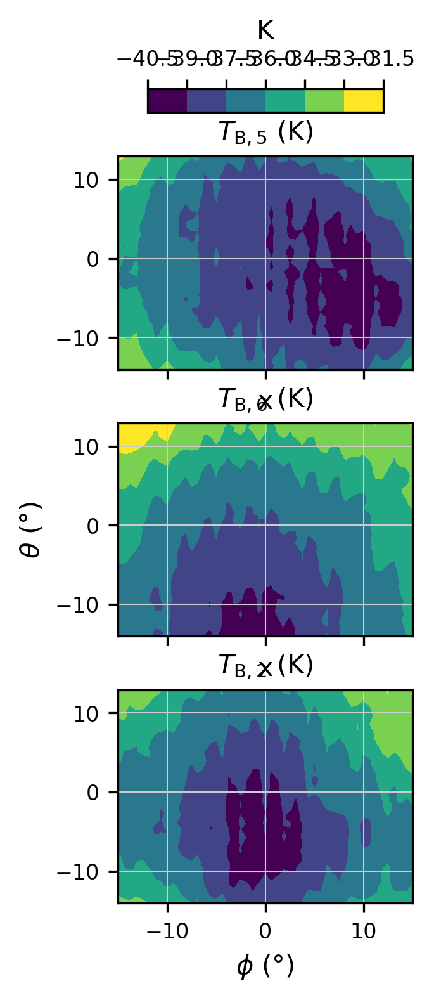

In [32]:
### calculate the total VZA 
fig, ax = plt.subplots(3, 1, figsize=(2, 6), sharex=True, sharey=True, gridspec_kw={'hspace': 0.25})
ds_cc.BT_5.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[0], add_colorbar=False)
ds_cc.BT_2.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[2], add_colorbar=False)
im = ds_cc.BT_6.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[1], add_colorbar=False)

plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

ax[1].set_ylabel(r'$\theta$ (°)')
ax[0].set_ylabel('')    
ax[2].set_ylabel('')
#ax[0].set_xlabel(r'$\phi$ (°)')
# ax[1].set_xlabel(r'$\phi$ (°)')
ax[2].set_xlabel(r'$\phi$ (°)')
ax[0].set_title('$T_\mathrm{B,5}$ (K)')
ax[1].set_title('$T_\mathrm{B,6}$ (K)')
ax[2].set_title('$T_\mathrm{B,2}$ (K)')


cbar = fig.colorbar(im, ax=ax, label='K', orientation='horizontal', aspect=10, pad=0.05, shrink=0.8, fraction=0.1, 
             location='top'),

### 

In [19]:
ds_raw_bt

<xarray.Dataset>
Dimensions:    (band: 5, time: 33362, x: 635, y: 507)
Coordinates:
  * time       (time) datetime64[ns] 2022-03-16T08:48:54 ... 2022-03-16T18:29:38
Dimensions without coordinates: band, x, y
Data variables:
    BT_2D      (band, time, x, y) float32 ...
    BT_Center  (band, time) float32 ...
    alt        (band, time) float32 ...
    lat        (band, time) float32 ...
    lon        (band, time) float32 ...
    yaw        (band, time) float32 ...
Attributes: (12/21)
    Conventions:             "CF-1.8"
    author:                  Michael Schäfer, Sophie Rosenburg, André Ehrlich...
    campaign:                HALO-AC3
    comment_1:               Band wavelength range: 7.70 - 12.00 micrometers
    comment_2:               Flight direction is towards positive y-direction...
    comment_3:               Thermal infrared imager information: focal lengt...
    ...                      ...
    research_flight_day:     20220316
    research_flight_number:  RF06
    source:                  Airborne imaging with the VELOX system
    title:                   Two-dimensional cloud-top or surface brightness ...
    variable:                BT_2D, BT_Center
    version:                 Version v3.0 from 2023-09-11

[########################################] | 100% Completed | 10.17 s
[########################################] | 100% Completed | 10.83 s
[########################################] | 100% Completed | 11.01 s


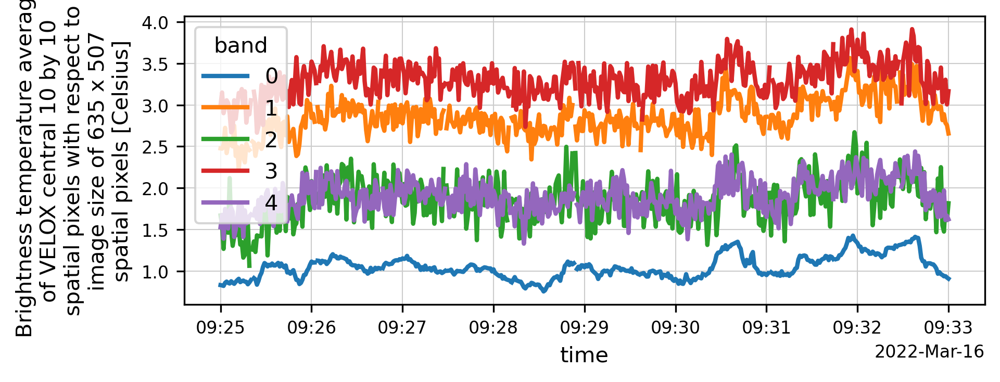

In [130]:

ds_raw_bt = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/HALO-AC3_VELOX_sea_ice/2022-03-16_v_0.1.zarr', engine='zarr')
ds_raw_sel = ds_raw_bt.sel(time=slice('2022-03-16T09:25:00', '2022-03-16T09:33:00')).load()
ds_raw_sel.BT_Center.plot(hue='band')
ds_raw_sel['quality_flag'] = ds_raw_sel.BT_2D.isel(band=0).isnull().sum(dim=('x', 'y')) == 0

ds_raw_sel['BT_5'] = ds_raw_sel.isel(band=3).BT_2D
ds_raw_sel['BT_6'] = ds_raw_sel.isel(band=4).BT_2D
ds_raw_sel['BT_2'] = ds_raw_sel.isel(band=1).BT_2D

bt5 = average_concat_dask(ds_raw_sel, variable='BT_5',slicing_positions=np.arange(0, 500, 10))
bt6 = average_concat_dask(ds_raw_sel, variable='BT_6',slicing_positions=np.arange(0, 500, 10))
bt2 = average_concat_dask(ds_raw_sel, variable='BT_2',slicing_positions=np.arange(0, 500, 10))

In [131]:
### calcualte the vza for the slicing positions with 10m equals one pixel and 10km flying height
vza = np.arctan(np.arange(-2500, 2500, 100) / 10000) * 180 / np.pi
vza

phi = np.arctan(np.linspace(-3200, 3200, 635) / 10000) * 180 / np.pi


ds_cc_ocean = xr.Dataset(
    data_vars=dict(
        BT_5=(['vza','x', 'time'], bt5),
        BT_6=(['vza','x', 'time'], bt6),
        BT_2=(['vza','x', 'time'], bt2),
    ),
    coords=dict(
        time=np.arange(bt5.shape[2]),
        x=phi, 
        vza=vza[:-1],
    ),
)

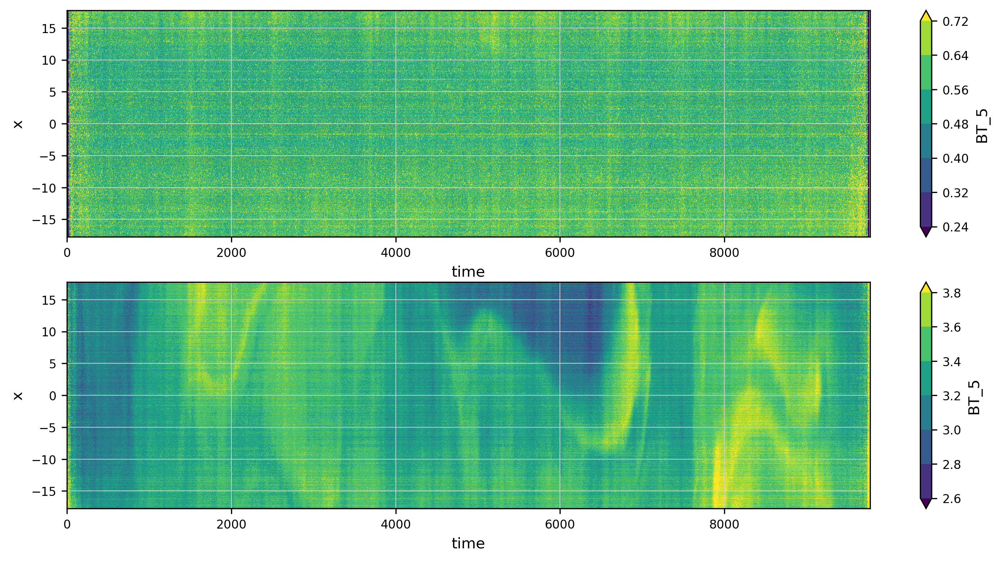

In [132]:
fig, ax = plt.subplots(2, 1, figsize=(12, 6))

ds_cc_ocean.BT_5.std(dim='vza').plot.contourf(x='time', y='x', robust=True, ax=ax[0])
ds_cc_ocean.BT_5.mean(dim='vza').plot.contourf(x='time', y='x', robust=True, ax=ax[1])

,mean,std
band,,
0,1.033933,0.016394
1,2.812170,0.073005
2,1.800145,0.124060
3,3.282074,0.096729
4,1.877481,0.081355


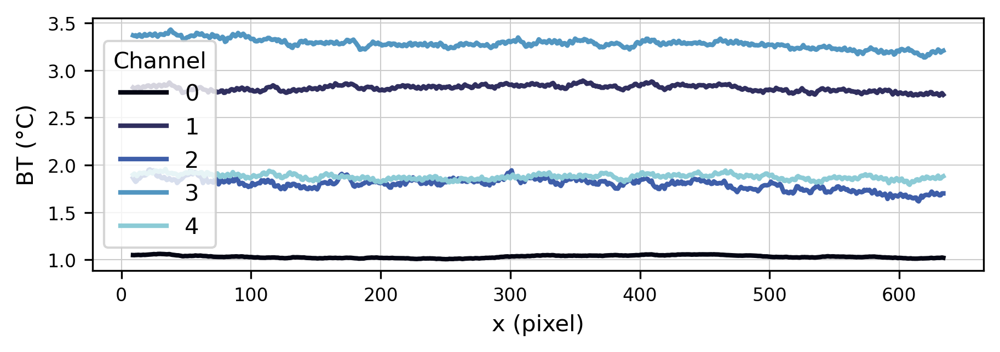

In [133]:
# ds_raw_sel.BT_2D.mean(dim='time').plot(
#     x='x', y='y', cmap='viridis', col='band', col_wrap=3, robust=True,)

fig, ax = plt.subplots(1, 1, figsize=(7, 2))

ax.set_prop_cycle(color=cmocean.cm.ice(np.linspace(0, 1, 6)))

ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').rolling(x=10).mean().plot(
    x='x', hue='band', ax=ax, lw=2)

legend = ax.get_legend()

legend.set_title('Channel')
ax.set_ylabel('BT (°C)')
ax.set_xlabel('x (pixel)')

col2 = ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').std(dim='x').to_dataframe()
col1 = ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').mean(dim='x').to_dataframe()

df = pd.concat([col1, col2], axis=1)
df.columns = ['mean', 'std']
df

<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:53: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:53: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/835430992.py:29: SyntaxWarning: invalid escape sequence '\m'
  ax[1,0].set_ylabel('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/835430992.py:30: SyntaxWarning: invalid escape sequence '\m'
  ax[2,0].set_ylabel('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_2416254/835430992.py:31: SyntaxWarning: invalid escape sequence '\m'
  ax[3,0].set_ylabel('$T_\mathrm{B,2}$ (K)')
/

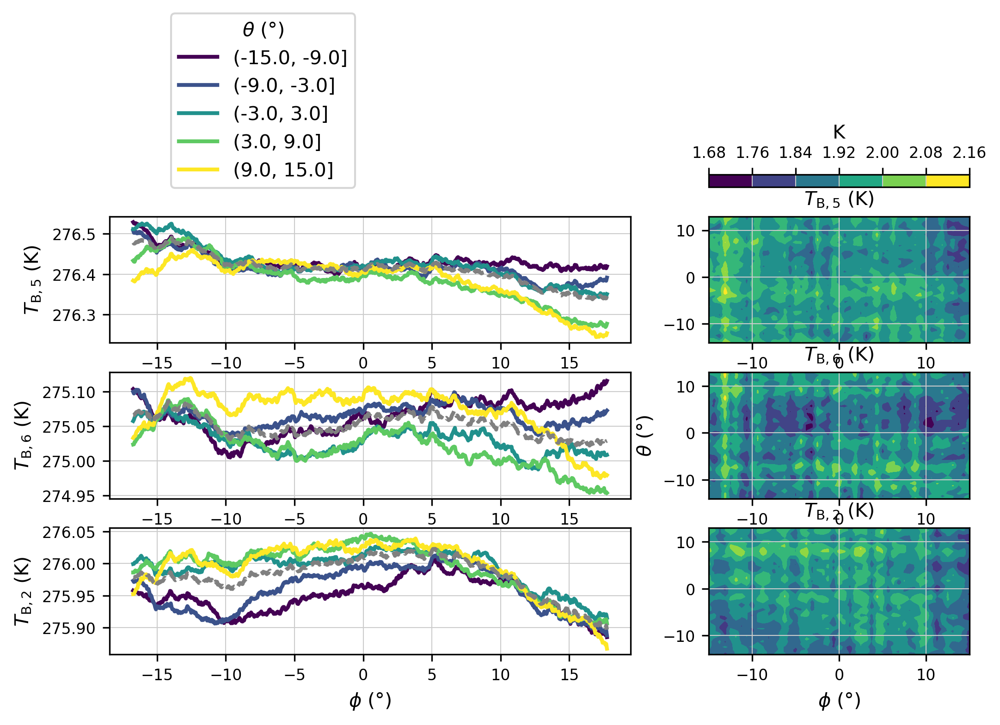

In [134]:
fig, ax = plt.subplots(4, 2, figsize=(8, 4.5),
 gridspec_kw={'width_ratios': [2, 1],
              'height_ratios': [0.1, 1, 1, 1],
              'hspace': 0.3,})


plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

fs = 10
plt.rcParams['font.size'] = fs


ds_gp = ds_cc_ocean.groupby_bins('vza', bins=np.linspace(-15, 15, 6)).mean()

for a in ax[:,0]:
    a.set_prop_cycle(color=plt.cm.viridis(np.linspace(0, 1, 5)))
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_5.plot(x='x', hue='vza_bins', ax=ax[1,0],lw=2, add_legend=True)
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_6.plot(x='x', hue='vza_bins', ax=ax[2,0], add_legend=False,  lw=2)
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_2.plot(x='x', hue='vza_bins', ax=ax[3,0], add_legend=False, lw=2)

legend= ax[1,0].get_legend()
(ds_cc_ocean.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_5.plot(x='x', color='gray', ax=ax[1, 0], lw=2, ls='--')
(ds_cc_ocean.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_6.plot(x='x', color='gray', ax=ax[2, 0], lw=2, ls='--')
(ds_cc_ocean.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_2.plot(x='x', color='gray', ax=ax[3, 0], lw=2, ls='--')

legend.set_bbox_to_anchor((0.1, 1.15))
legend.set_title(r'$\theta$ (°)')

ax[1,0].set_ylabel('$T_\mathrm{B,5}$ (K)')
ax[2,0].set_ylabel('$T_\mathrm{B,6}$ (K)')
ax[3,0].set_ylabel('$T_\mathrm{B,2}$ (K)')

ax[1,0].set_xlabel('')
ax[2,0].set_xlabel('')
ax[3,0].set_xlabel(r'$\phi$ (°)')


### calculate the total VZA 
ds_cc_ocean.BT_5.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[1, 1], add_colorbar=False)
ds_cc_ocean.BT_2.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[3,1], add_colorbar=False)
im = ds_cc_ocean.BT_6.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[2,1], add_colorbar=False)

plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

ax[2, 1].set_ylabel(r'$\theta$ (°)')
ax[1, 1].set_ylabel('')    
ax[3, 1].set_ylabel('')
#ax[0].set_xlabel(r'$\phi$ (°)')
# ax[1].set_xlabel(r'$\phi$ (°)')
ax[3, 1].set_xlabel(r'$\phi$ (°)')
ax[1, 1].set_title('$T_\mathrm{B,5}$ (K)')
ax[2, 1].set_title('$T_\mathrm{B,6}$ (K)')
ax[3, 1].set_title('$T_\mathrm{B,2}$ (K)')

ax[0,0].set_visible(False)

### append an axis on the right top to show the colorbar; 



cbar = fig.colorbar(im, cax=ax[0,1], label='K', orientation='horizontal', location='top'),

<>:24: SyntaxWarning: invalid escape sequence '\m'
<>:25: SyntaxWarning: invalid escape sequence '\m'
<>:26: SyntaxWarning: invalid escape sequence '\m'
<>:24: SyntaxWarning: invalid escape sequence '\m'
<>:25: SyntaxWarning: invalid escape sequence '\m'
<>:26: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/506568858.py:24: SyntaxWarning: invalid escape sequence '\m'
  ax[0].set_ylabel('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/506568858.py:25: SyntaxWarning: invalid escape sequence '\m'
  ax[1].set_ylabel('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_2416254/506568858.py:26: SyntaxWarning: invalid escape sequence '\m'
  ax[2].set_ylabel('$T_\mathrm{B,2}$ (K)')


Text(0.5, 0, '$\\phi$ (°)')

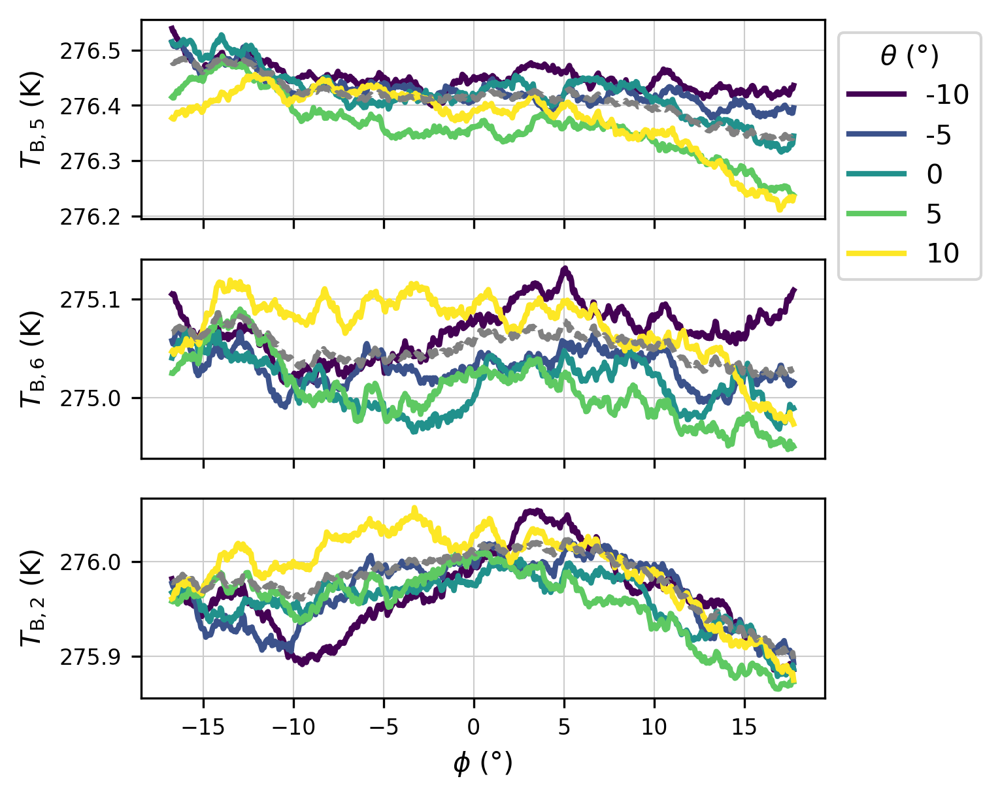

In [135]:
fig, ax = plt.subplots(3, 1, figsize=(4.5, 4.5), sharex=True)


plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

fs = 10
plt.rcParams['font.size'] = fs


for a in ax:
    a.set_prop_cycle(color=plt.cm.viridis(np.linspace(0, 1, 5)))
(ds_cc_ocean.interp(vza=[-10, -5, 0, 5, 10]).mean(dim='time').rolling(x=20).mean() + 273.15).BT_5.plot(x='x', hue='vza', ax=ax[0],lw=2, add_legend=True)
(ds_cc_ocean.interp(vza=[-10, -5, 0, 5, 10]).mean(dim='time').rolling(x=20).mean() + 273.15).BT_6.plot(x='x', hue='vza', ax=ax[1], add_legend=False,  lw=2)
(ds_cc_ocean.interp(vza=[-10, -5, 0, 5, 10]).mean(dim='time').rolling(x=20).mean() + 273.15).BT_2.plot(x='x', hue='vza', ax=ax[2], add_legend=False, lw=2)

legend= ax[0].get_legend()
(ds_cc_ocean.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_5.plot(x='x', color='gray', ax=ax[0], lw=2, ls='--')
(ds_cc_ocean.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_6.plot(x='x', color='gray', ax=ax[1], lw=2, ls='--')
(ds_cc_ocean.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_2.plot(x='x', color='gray', ax=ax[2], lw=2, ls='--')

legend.set_bbox_to_anchor((1, 1))
legend.set_title(r'$\theta$ (°)')

ax[0].set_ylabel('$T_\mathrm{B,5}$ (K)')
ax[1].set_ylabel('$T_\mathrm{B,6}$ (K)')
ax[2].set_ylabel('$T_\mathrm{B,2}$ (K)')

ax[0].set_xlabel('')
ax[1].set_xlabel('')
ax[2].set_xlabel(r'$\phi$ (°)')

<>:13: SyntaxWarning: invalid escape sequence '\m'
<>:14: SyntaxWarning: invalid escape sequence '\m'
<>:15: SyntaxWarning: invalid escape sequence '\m'
<>:13: SyntaxWarning: invalid escape sequence '\m'
<>:14: SyntaxWarning: invalid escape sequence '\m'
<>:15: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/1555637567.py:13: SyntaxWarning: invalid escape sequence '\m'
  ax[0].set_title('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/1555637567.py:14: SyntaxWarning: invalid escape sequence '\m'
  ax[1].set_title('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_2416254/1555637567.py:15: SyntaxWarning: invalid escape sequence '\m'
  ax[2].set_title('$T_\mathrm{B,2}$ (K)')


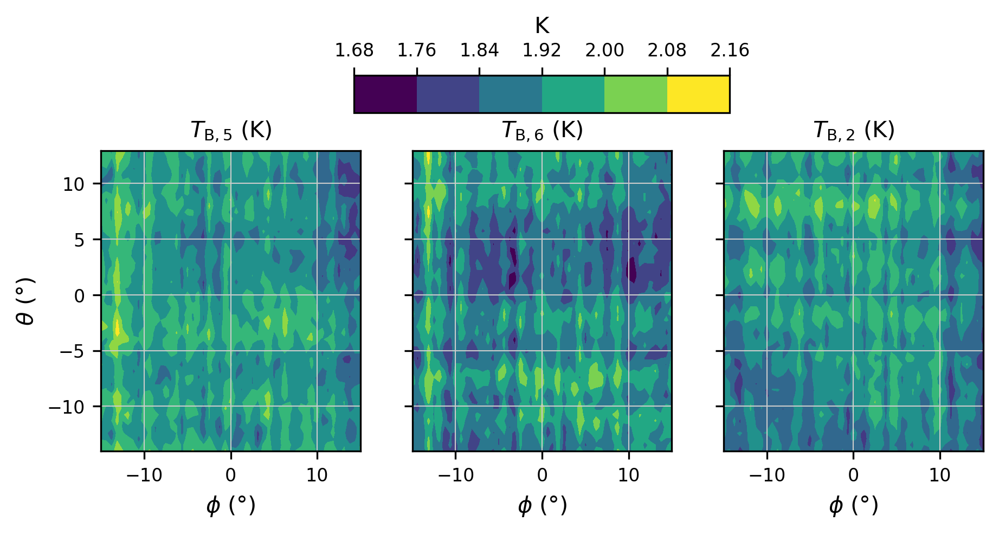

In [136]:
### calculate the total VZA 
fig, ax = plt.subplots(1, 3, figsize=(7, 3), sharex=True, sharey=True)
ds_cc_ocean.BT_5.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[0], add_colorbar=False)
ds_cc_ocean.BT_2.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[2], add_colorbar=False)
im = ds_cc_ocean.BT_6.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[1], add_colorbar=False)

ax[0].set_ylabel(r'$\theta$ (°)')
ax[1].set_ylabel('')    
ax[2].set_ylabel('')
ax[0].set_xlabel(r'$\phi$ (°)')
ax[1].set_xlabel(r'$\phi$ (°)')
ax[2].set_xlabel(r'$\phi$ (°)')
ax[0].set_title('$T_\mathrm{B,5}$ (K)')
ax[1].set_title('$T_\mathrm{B,6}$ (K)')
ax[2].set_title('$T_\mathrm{B,2}$ (K)')


fig.colorbar(im, ax=ax, label='K', orientation='horizontal', aspect=10, pad=0.1, shrink=0.8, fraction=0.1, 
             location='top')

[########################################] | 100% Completed | 28.34 s
[########################################] | 100% Completed | 23.75 s
[########################################] | 100% Completed | 22.46 s


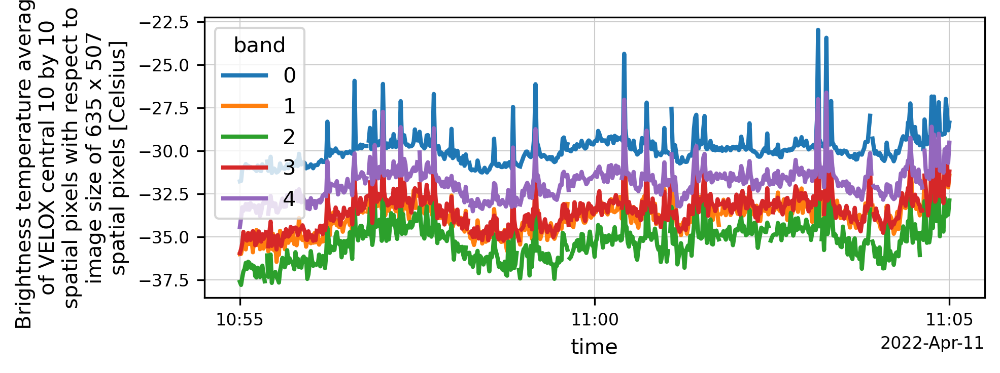

In [137]:

ds_raw_bt = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/HALO-AC3_VELOX_sea_ice/2022-04-11_v_0.1.zarr', engine='zarr')
ds_raw_sel = ds_raw_bt.sel(time=slice('2022-04-11T10:55:00', '2022-04-11T11:05:00')).persist()
ds_raw_sel.BT_Center.plot(hue='band')
ds_raw_sel['quality_flag'] = ds_raw_sel.BT_2D.isel(band=0).isnull().sum(dim=('x', 'y')) == 0

ds_raw_sel['BT_5'] = ds_raw_sel.isel(band=3).BT_2D
ds_raw_sel['BT_6'] = ds_raw_sel.isel(band=4).BT_2D
ds_raw_sel['BT_2'] = ds_raw_sel.isel(band=1).BT_2D

bt5 = average_concat_dask(ds_raw_sel, variable='BT_5',slicing_positions=np.arange(0, 500, 10))
bt6 = average_concat_dask(ds_raw_sel, variable='BT_6',slicing_positions=np.arange(0, 500, 10))
bt2 = average_concat_dask(ds_raw_sel, variable='BT_2',slicing_positions=np.arange(0, 500, 10))

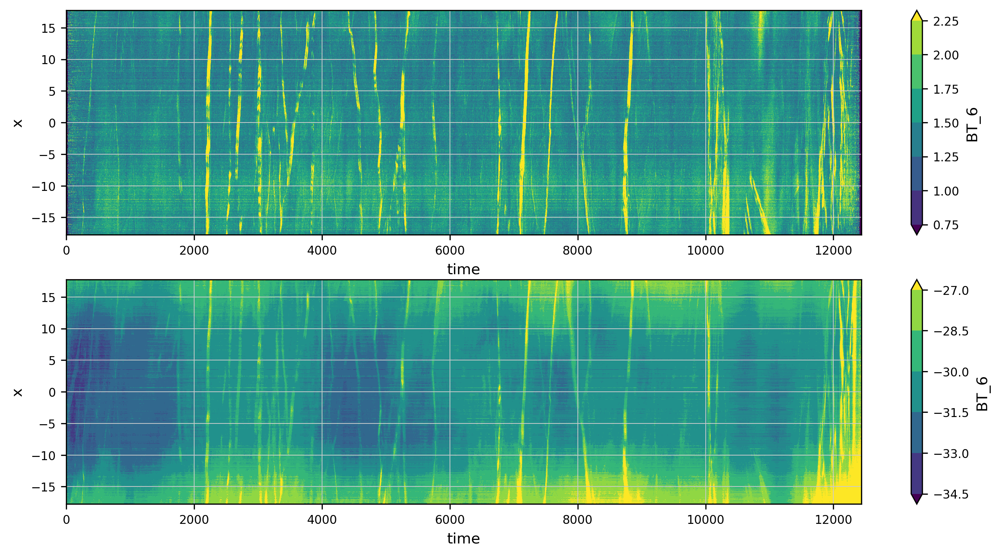

In [138]:
### calcualte the vza for the slicing positions with 10m equals one pixel and 10km flying height
vza = np.arctan(np.arange(-2500, 2500, 100) / 10000) * 180 / np.pi
vza

phi = np.arctan(np.linspace(-3200, 3200, 635) / 10000) * 180 / np.pi


ds_cc_cirrus = xr.Dataset(
    data_vars=dict(
        BT_5=(['vza','x', 'time'], bt5),
        BT_6=(['vza','x', 'time'], bt6),
        BT_2=(['vza','x', 'time'], bt2),
    ),
    coords=dict(
        time=np.arange(bt5.shape[2]),
        x=phi, 
        vza=vza[:-1],
    ),
)


fig, ax = plt.subplots(2, 1, figsize=(12, 6))

ds_cc_cirrus.BT_6.std(dim='vza').plot.contourf(x='time', y='x', robust=True, ax=ax[0])
ds_cc_cirrus.BT_6.mean(dim='vza').plot.contourf(x='time', y='x', robust=True, ax=ax[1])

<>:25: SyntaxWarning: invalid escape sequence '\m'
<>:26: SyntaxWarning: invalid escape sequence '\m'
<>:27: SyntaxWarning: invalid escape sequence '\m'
<>:25: SyntaxWarning: invalid escape sequence '\m'
<>:26: SyntaxWarning: invalid escape sequence '\m'
<>:27: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/3470945051.py:25: SyntaxWarning: invalid escape sequence '\m'
  ax[0].set_ylabel('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/3470945051.py:26: SyntaxWarning: invalid escape sequence '\m'
  ax[1].set_ylabel('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_2416254/3470945051.py:27: SyntaxWarning: invalid escape sequence '\m'
  ax[2].set_ylabel('$T_\mathrm{B,2}$ (K)')


Text(0.5, 0, '$\\phi$ (°)')

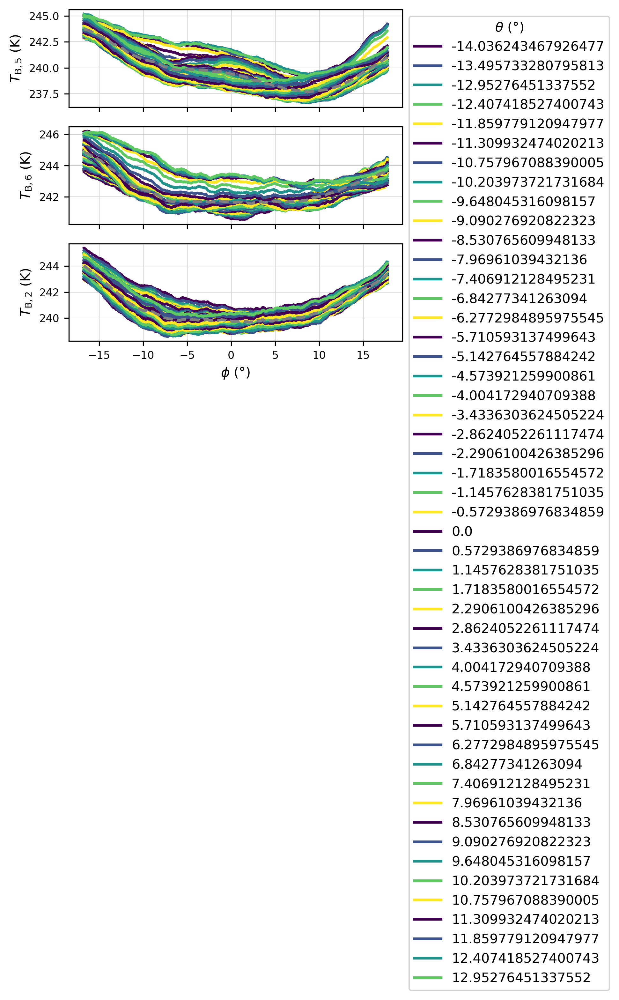

In [139]:
fig, ax = plt.subplots(3, 1, figsize=(4.5, 4.5), sharex=True)


plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

fs = 10
plt.rcParams['font.size'] = fs

vza_interp = np.linspace(-10, 10, 5)

for a in ax:
    a.set_prop_cycle(color=plt.cm.viridis(np.linspace(0, 1, 5)))
(ds_cc_cirrus.mean(dim='time').rolling(x=20).mean() + 273.15).BT_5.plot(x='x', hue='vza', ax=ax[0],lw=2, add_legend=True)
(ds_cc_cirrus.mean(dim='time').rolling(x=20).mean() + 273.15).BT_6.plot(x='x', hue='vza', ax=ax[1], add_legend=False,  lw=2)
(ds_cc_cirrus.mean(dim='time').rolling(x=20).mean() + 273.15).BT_2.plot(x='x', hue='vza', ax=ax[2], add_legend=False, lw=2)

legend= ax[0].get_legend()
(ds_cc_cirrus.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_5.plot(x='x', color='gray', ax=ax[0], lw=2, ls='--')
(ds_cc_cirrus.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_6.plot(x='x', color='gray', ax=ax[1], lw=2, ls='--')
(ds_cc_cirrus.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_2.plot(x='x', color='gray', ax=ax[2], lw=2, ls='--')

legend.set_bbox_to_anchor((1, 1))
legend.set_title(r'$\theta$ (°)')

ax[0].set_ylabel('$T_\mathrm{B,5}$ (K)')
ax[1].set_ylabel('$T_\mathrm{B,6}$ (K)')
ax[2].set_ylabel('$T_\mathrm{B,2}$ (K)')

ax[0].set_xlabel('')
ax[1].set_xlabel('')
ax[2].set_xlabel(r'$\phi$ (°)')

<>:13: SyntaxWarning: invalid escape sequence '\m'
<>:14: SyntaxWarning: invalid escape sequence '\m'
<>:15: SyntaxWarning: invalid escape sequence '\m'
<>:13: SyntaxWarning: invalid escape sequence '\m'
<>:14: SyntaxWarning: invalid escape sequence '\m'
<>:15: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/2842335337.py:13: SyntaxWarning: invalid escape sequence '\m'
  ax[0].set_title('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/2842335337.py:14: SyntaxWarning: invalid escape sequence '\m'
  ax[1].set_title('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_2416254/2842335337.py:15: SyntaxWarning: invalid escape sequence '\m'
  ax[2].set_title('$T_\mathrm{B,2}$ (K)')


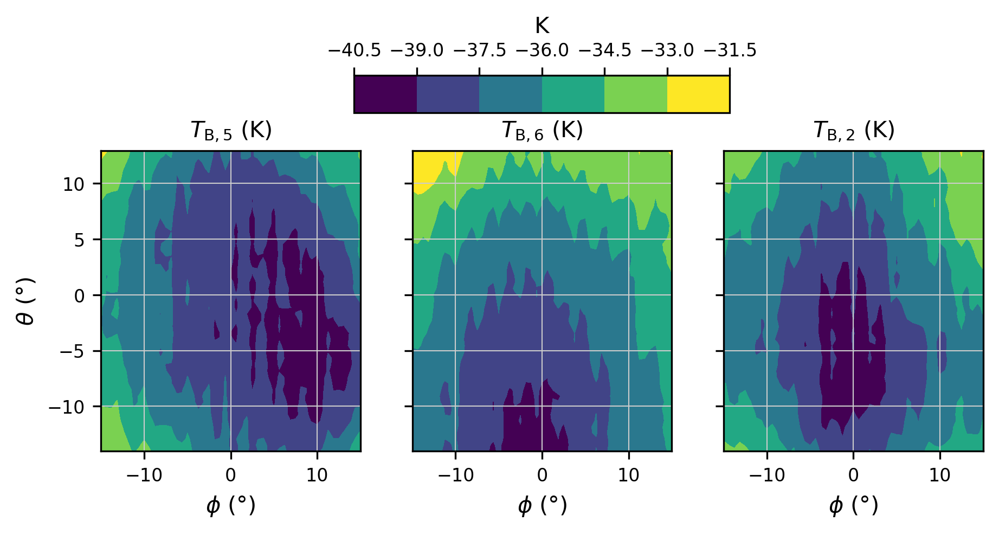

In [140]:
### calculate the total VZA 
fig, ax = plt.subplots(1, 3, figsize=(7, 3), sharex=True, sharey=True)
ds_cc.BT_5.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[0], add_colorbar=False)
ds_cc.BT_2.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[2], add_colorbar=False)
im = ds_cc.BT_6.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[1], add_colorbar=False)

ax[0].set_ylabel(r'$\theta$ (°)')
ax[1].set_ylabel('')    
ax[2].set_ylabel('')
ax[0].set_xlabel(r'$\phi$ (°)')
ax[1].set_xlabel(r'$\phi$ (°)')
ax[2].set_xlabel(r'$\phi$ (°)')
ax[0].set_title('$T_\mathrm{B,5}$ (K)')
ax[1].set_title('$T_\mathrm{B,6}$ (K)')
ax[2].set_title('$T_\mathrm{B,2}$ (K)')


fig.colorbar(im, ax=ax, label='K', orientation='horizontal', aspect=10, pad=0.1, shrink=0.8, fraction=0.1, 
             location='top')

[########################################] | 100% Completed | 10.39 s
[########################################] | 100% Completed | 10.34 s
[########################################] | 100% Completed | 9.00 ss


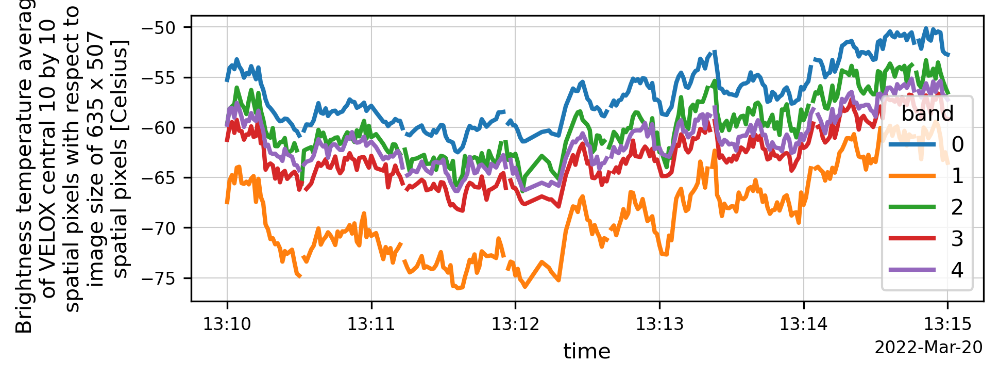

In [141]:

ds_raw_bt = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/HALO-AC3_VELOX_sea_ice/2022-03-20_v_0.1.zarr', engine='zarr')
ds_raw_sel = ds_raw_bt.sel(time=slice('2022-03-20T13:10:00', '2022-03-20T13:15:00')).load()
ds_raw_sel.BT_Center.plot(hue='band')
ds_raw_sel['quality_flag'] = ds_raw_sel.BT_2D.isel(band=0).isnull().sum(dim=('x', 'y')) == 0

ds_raw_sel['BT_5'] = ds_raw_sel.isel(band=3).BT_2D
ds_raw_sel['BT_6'] = ds_raw_sel.isel(band=4).BT_2D
ds_raw_sel['BT_2'] = ds_raw_sel.isel(band=1).BT_2D

bt5 = average_concat_dask(ds_raw_sel, variable='BT_5',slicing_positions=np.arange(0, 500, 10))
bt6 = average_concat_dask(ds_raw_sel, variable='BT_6',slicing_positions=np.arange(0, 500, 10))
bt2 = average_concat_dask(ds_raw_sel, variable='BT_2',slicing_positions=np.arange(0, 500, 10))

In [ ]:
# ds_raw_sel.BT_2D.mean(dim='time').plot(
#     x='x', y='y', cmap='viridis', col='band', col_wrap=3, robust=True,)

fig, ax = plt.subplots(1, 1, figsize=(7, 2))

ax.set_prop_cycle(color=cmocean.cm.ice(np.linspace(0, 1, 6)))

ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').rolling(x=10).mean().plot(
    x='x', hue='band', ax=ax, lw=2)

legend = ax.get_legend()

legend.set_title('Channel')
ax.set_ylabel('BT (°C)')
ax.set_xlabel('x (pixel)')

col2 = ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').std(dim='x').to_dataframe()
col1 = ds_raw_sel.BT_2D.mean(dim='time').sel(y=slice(248, 258)).mean(dim='y').mean(dim='x').to_dataframe()

df = pd.concat([col1, col2], axis=1)
df.columns = ['mean', 'std']
df

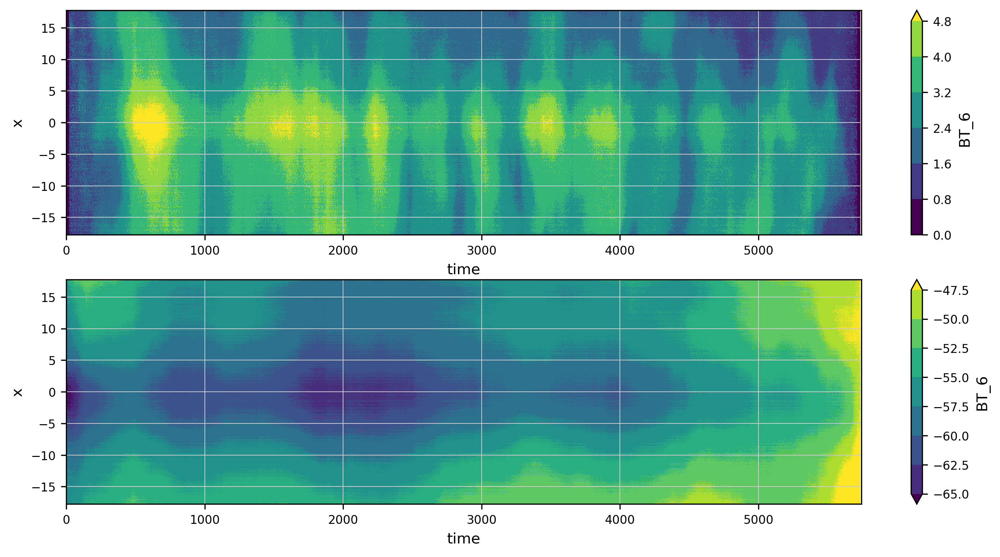

In [143]:
### calcualte the vza for the slicing positions with 10m equals one pixel and 10km flying height
vza = np.arctan(np.arange(-2500, 2500, 100) / 10000) * 180 / np.pi
vza

phi = np.arctan(np.linspace(-3200, 3200, 635) / 10000) * 180 / np.pi


ds_cc_cloud = xr.Dataset(
    data_vars=dict(
        BT_5=(['vza','x', 'time'], bt5),
        BT_6=(['vza','x', 'time'], bt6),
        BT_2=(['vza','x', 'time'], bt2),
    ),
    coords=dict(
        time=np.arange(bt5.shape[2]),
        x=phi, 
        vza=vza[:-1],
    ),
)


fig, ax = plt.subplots(2, 1, figsize=(12, 6))

ds_cc_cloud.BT_6.std(dim='vza').plot.contourf(x='time', y='x', robust=True, ax=ax[0])
ds_cc_cloud.BT_6.mean(dim='vza').plot.contourf(x='time', y='x', robust=True, ax=ax[1])

<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:53: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:53: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/3351889056.py:29: SyntaxWarning: invalid escape sequence '\m'
  ax[1,0].set_ylabel('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/3351889056.py:30: SyntaxWarning: invalid escape sequence '\m'
  ax[2,0].set_ylabel('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_2416254/3351889056.py:31: SyntaxWarning: invalid escape sequence '\m'
  ax[3,0].set_ylabel('$T_\mathrm{B,2}$ (K)'

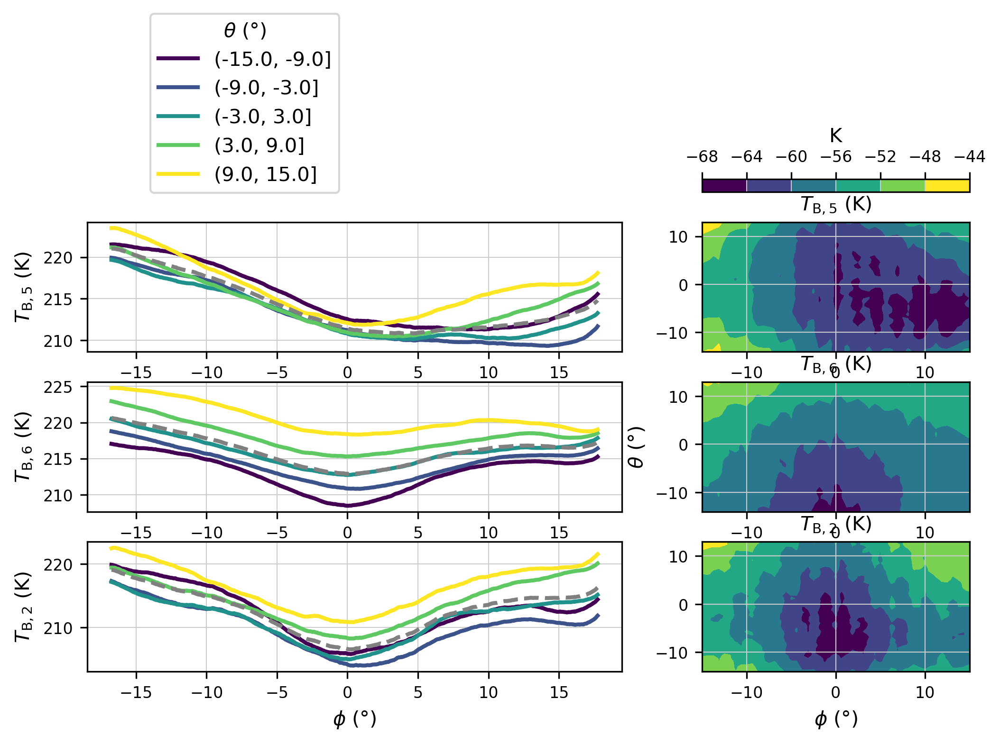

In [144]:
fig, ax = plt.subplots(4, 2, figsize=(8, 4.5),
 gridspec_kw={'width_ratios': [2, 1],
              'height_ratios': [0.1, 1, 1, 1],
              'hspace': 0.3,})


plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

fs = 10
plt.rcParams['font.size'] = fs


ds_gp = ds_cc_cloud.groupby_bins('vza', bins=np.linspace(-15, 15, 6)).mean()

for a in ax[:,0]:
    a.set_prop_cycle(color=plt.cm.viridis(np.linspace(0, 1, 5)))
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_5.plot(x='x', hue='vza_bins', ax=ax[1,0],lw=2, add_legend=True)
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_6.plot(x='x', hue='vza_bins', ax=ax[2,0], add_legend=False,  lw=2)
(ds_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_2.plot(x='x', hue='vza_bins', ax=ax[3,0], add_legend=False, lw=2)

legend= ax[1,0].get_legend()
(ds_cc_cloud.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_5.plot(x='x', color='gray', ax=ax[1, 0], lw=2, ls='--')
(ds_cc_cloud.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_6.plot(x='x', color='gray', ax=ax[2, 0], lw=2, ls='--')
(ds_cc_cloud.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_2.plot(x='x', color='gray', ax=ax[3, 0], lw=2, ls='--')

legend.set_bbox_to_anchor((0.1, 1.15))
legend.set_title(r'$\theta$ (°)')

ax[1,0].set_ylabel('$T_\mathrm{B,5}$ (K)')
ax[2,0].set_ylabel('$T_\mathrm{B,6}$ (K)')
ax[3,0].set_ylabel('$T_\mathrm{B,2}$ (K)')

ax[1,0].set_xlabel('')
ax[2,0].set_xlabel('')
ax[3,0].set_xlabel(r'$\phi$ (°)')


### calculate the total VZA 
ds_cc_cloud.BT_5.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[1, 1], add_colorbar=False)
ds_cc_cloud.BT_2.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[3,1], add_colorbar=False)
im = ds_cc_cloud.BT_6.mean(dim='time').interp(x=np.linspace(-15, 15, 49)).plot.contourf(ax=ax[2,1], add_colorbar=False)

plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

ax[2, 1].set_ylabel(r'$\theta$ (°)')
ax[1, 1].set_ylabel('')    
ax[3, 1].set_ylabel('')
#ax[0].set_xlabel(r'$\phi$ (°)')
# ax[1].set_xlabel(r'$\phi$ (°)')
ax[3, 1].set_xlabel(r'$\phi$ (°)')
ax[1, 1].set_title('$T_\mathrm{B,5}$ (K)')
ax[2, 1].set_title('$T_\mathrm{B,6}$ (K)')
ax[3, 1].set_title('$T_\mathrm{B,2}$ (K)')

ax[0,0].set_visible(False)

### append an axis on the right top to show the colorbar; 



cbar = fig.colorbar(im, cax=ax[0,1], label='K', orientation='horizontal', location='top'),

<>:23: SyntaxWarning: invalid escape sequence '\m'
<>:24: SyntaxWarning: invalid escape sequence '\m'
<>:25: SyntaxWarning: invalid escape sequence '\m'
<>:23: SyntaxWarning: invalid escape sequence '\m'
<>:24: SyntaxWarning: invalid escape sequence '\m'
<>:25: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2416254/93819656.py:23: SyntaxWarning: invalid escape sequence '\m'
  ax[0].set_ylabel('$T_\mathrm{B,5}$ (K)')
/tmp/ipykernel_2416254/93819656.py:24: SyntaxWarning: invalid escape sequence '\m'
  ax[1].set_ylabel('$T_\mathrm{B,6}$ (K)')
/tmp/ipykernel_2416254/93819656.py:25: SyntaxWarning: invalid escape sequence '\m'
  ax[2].set_ylabel('$T_\mathrm{B,2}$ (K)')


Text(0.5, 0, '$\\phi$ (°)')

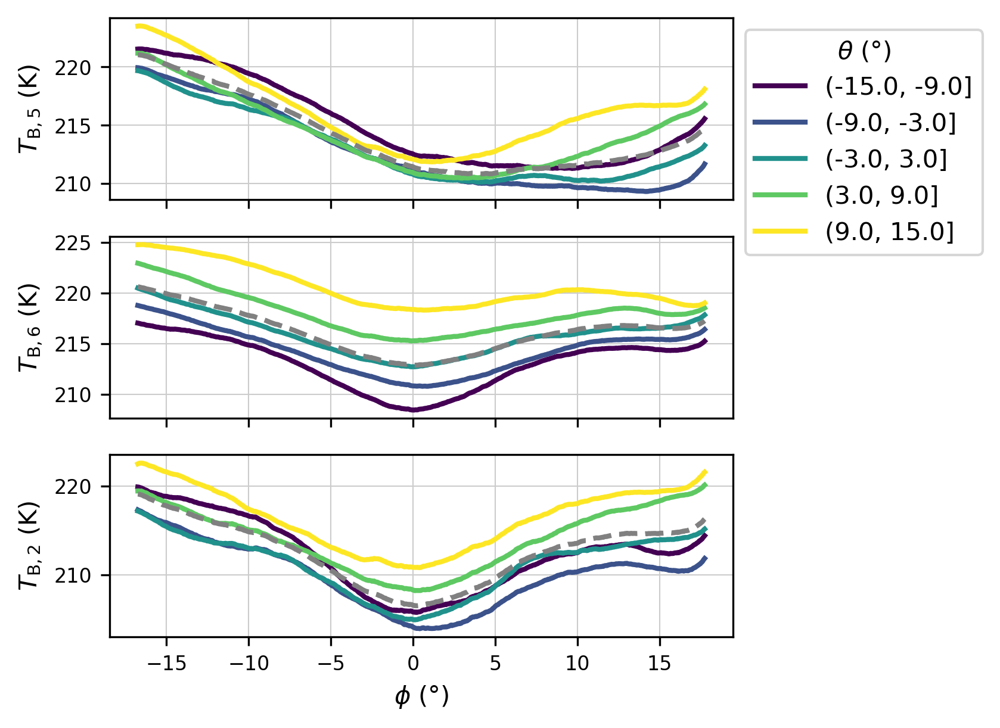

In [145]:
fig, ax = plt.subplots(3, 1, figsize=(4.5, 4.5), sharex=True)


plt.rcParams.update(json.load(open('/projekt_agmwend/home_rad/Joshua/MasterArbeit/plot_settings.json')))

fs = 10
plt.rcParams['font.size'] = fs
ds_cc_cloud_gp = ds_cc_cloud.groupby_bins('vza', bins=np.linspace(-15, 15, 6)).mean()
for a in ax:
    a.set_prop_cycle(color=plt.cm.viridis(np.linspace(0, 1, 5)))
(ds_cc_cloud_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_5.plot(x='x', hue='vza_bins', ax=ax[0],lw=2, add_legend=True)
(ds_cc_cloud_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_6.plot(x='x', hue='vza_bins', ax=ax[1], add_legend=False,  lw=2)
(ds_cc_cloud_gp.mean(dim='time').rolling(x=20).mean() + 273.15).BT_2.plot(x='x', hue='vza_bins', ax=ax[2], add_legend=False, lw=2)

legend= ax[0].get_legend()
(ds_cc_cloud.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_5.plot(x='x', color='gray', ax=ax[0], lw=2, ls='--')
(ds_cc_cloud.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_6.plot(x='x', color='gray', ax=ax[1], lw=2, ls='--')
(ds_cc_cloud.mean(dim=['time', 'vza']).rolling(x=20).mean() + 273.15).BT_2.plot(x='x', color='gray', ax=ax[2], lw=2, ls='--')

legend.set_bbox_to_anchor((1, 1))
legend.set_title(r'$\theta$ (°)')

ax[0].set_ylabel('$T_\mathrm{B,5}$ (K)')
ax[1].set_ylabel('$T_\mathrm{B,6}$ (K)')
ax[2].set_ylabel('$T_\mathrm{B,2}$ (K)')

ax[0].set_xlabel('')
ax[1].set_xlabel('')
ax[2].set_xlabel(r'$\phi$ (°)')

In [146]:
ds_raw_bt = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/HALO-AC3_VELOX_sea_ice/2022-04-01_v_0.1.zarr', engine='zarr', chunks='auto')
ds_raw_angle = ds_raw_bt.isel(x=slice(315, 325)).mean(dim='x').groupby_bins('y', bins=np.linspace(0, 500, 51)).mean()
ds_raw_angle

/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/xarray/core/dataset.py:275: UserWarning: The specified chunks separate the stored chunks along dimension "band" starting at index 4. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/xarray/core/dataset.py:275: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 202. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/xarray/core/dataset.py:275: UserWarning: The specified chunks separate the stored chunks along dimension "x" starting at index 202. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/xarray/core/dataset.py:275: UserW

<xarray.Dataset>
Dimensions:    (y_bins: 50, band: 5, time: 29147)
Coordinates:
  * time       (time) datetime64[ns] 2022-04-01T07:25:04 ... 2022-04-01T15:31:17
  * y_bins     (y_bins) object (0.0, 10.0] (10.0, 20.0] ... (490.0, 500.0]
Dimensions without coordinates: band
Data variables:
    BT_2D      (y_bins, band, time) float32 dask.array<chunksize=(40, 4, 202), meta=np.ndarray>
    BT_Center  (y_bins, band, time) float32 dask.array<chunksize=(50, 5, 29147), meta=np.ndarray>
    alt        (y_bins, band, time) float32 dask.array<chunksize=(50, 5, 29147), meta=np.ndarray>
    lat        (y_bins, band, time) float32 dask.array<chunksize=(50, 5, 29147), meta=np.ndarray>
    lon        (y_bins, band, time) float32 dask.array<chunksize=(50, 5, 29147), meta=np.ndarray>
    yaw        (y_bins, band, time) float32 dask.array<chunksize=(50, 5, 29147), meta=np.ndarray>

In [147]:
from dask.distributed import Client, LocalCluster

cluster = LocalCluster(
    n_workers=32,
    threads_per_worker=1,
    memory_limit='8GB',
)

client = Client(cluster)

/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34767 instead
  warnings.warn(


In [148]:
ds_raw_angle.compute()

<xarray.Dataset>
Dimensions:    (y_bins: 50, band: 5, time: 29147)
Coordinates:
  * time       (time) datetime64[ns] 2022-04-01T07:25:04 ... 2022-04-01T15:31:17
  * y_bins     (y_bins) object (0.0, 10.0] (10.0, 20.0] ... (490.0, 500.0]
Dimensions without coordinates: band
Data variables:
    BT_2D      (y_bins, band, time) float32 -4.603 -4.882 ... -11.97 -11.67
    BT_Center  (y_bins, band, time) float32 -4.184 -4.541 ... -13.72 -12.83
    alt        (y_bins, band, time) float32 485.8 485.8 ... 3.873e+03 3.865e+03
    lat        (y_bins, band, time) float32 67.82 67.82 67.82 ... 68.12 68.12
    lon        (y_bins, band, time) float32 20.33 20.33 20.33 ... 19.97 19.97
    yaw        (y_bins, band, time) float32 213.6 213.6 213.6 ... 139.9 139.9

In [149]:
ds_sel = ds_raw_angle.BT_2D.sel(time=slice('2022-04-01T10:00:00', '2022-04-01T13:50:00'))

In [150]:
radar = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/HALO-AC3_unified_data/unified_radar.nc', chunks='auto')

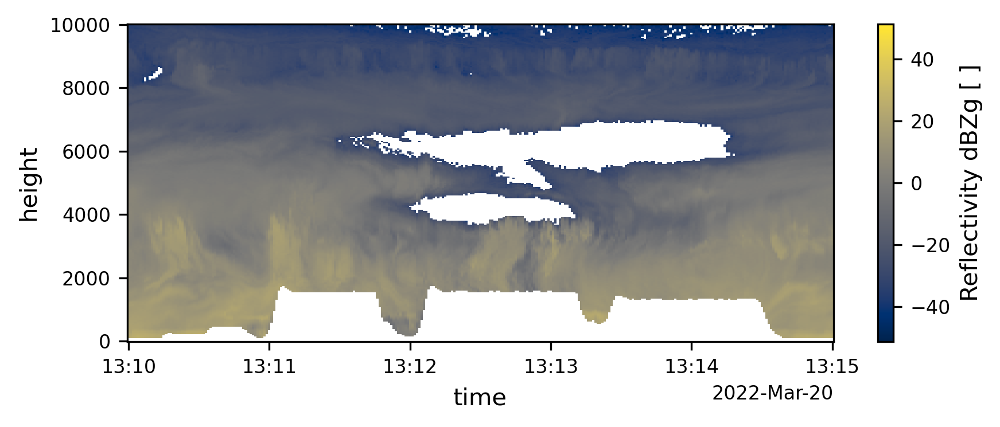

In [151]:
radar.sel(time=slice('2022-03-20T13:10:00', '2022-03-20T13:15:00')).dBZg.plot(x='time', cmap='cividis')

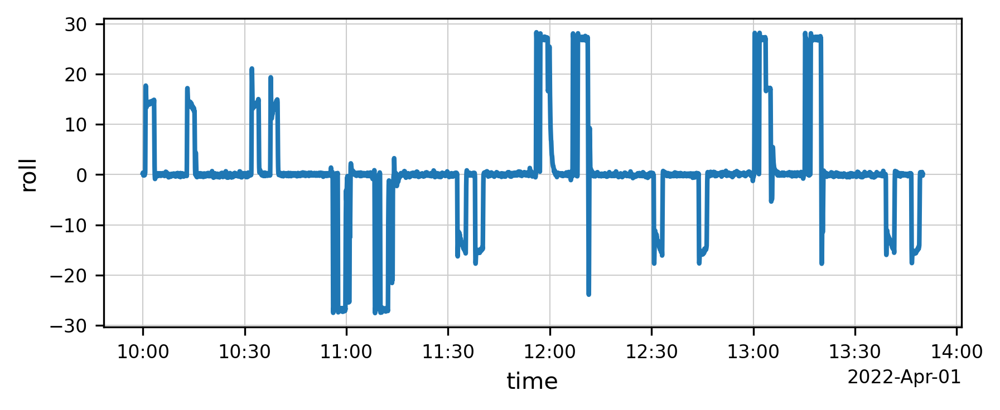

In [152]:
# x0 = ds_sel.isel(y_bins=0).values
# x1 = ds_sel.isel(y_bins=25).shift(time=14).values

ds_nav.sel(time=ds_sel.time)['roll'].plot()
roll_mask = abs(ds_nav.sel(time=ds_sel.time)['roll']) < 1
ds_sel = ds_sel.where(roll_mask)

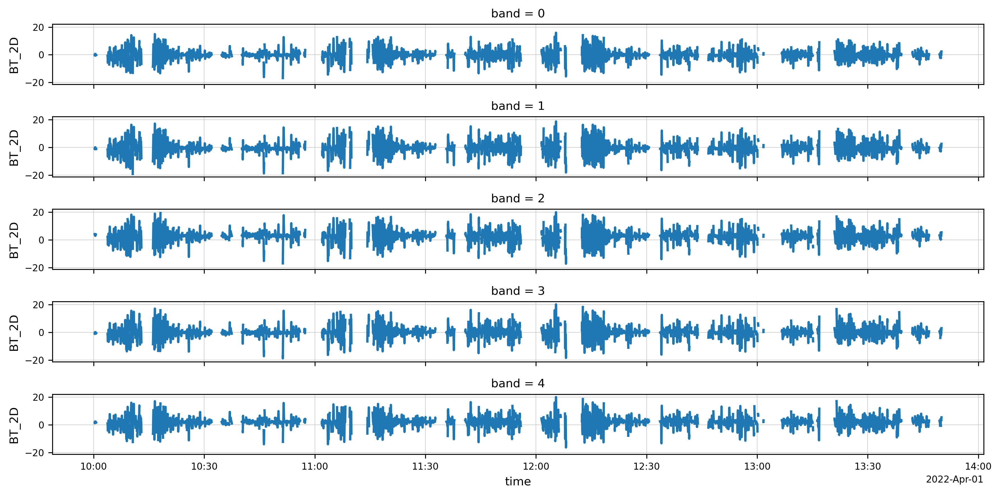

In [153]:
x0 = ds_sel.isel(y_bins=0)
x1 = ds_sel.isel(y_bins=25).shift(time=14)
delta = x1 - x0
delta.rolling(time=5).mean().plot(col='band', col_wrap=1, figsize=(12, 6), hue='band')

(array([2.000e+00, 2.000e+00, 2.000e+00, 6.000e+00, 8.000e+00, 1.400e+01,
        7.000e+00, 1.100e+01, 8.000e+00, 9.000e+00, 1.200e+01, 1.900e+01,
        1.600e+01, 7.000e+00, 1.700e+01, 1.900e+01, 1.700e+01, 1.900e+01,
        2.800e+01, 2.600e+01, 1.700e+01, 2.200e+01, 3.500e+01, 1.800e+01,
        3.500e+01, 2.500e+01, 3.000e+01, 3.500e+01, 4.500e+01, 4.500e+01,
        3.900e+01, 4.900e+01, 5.700e+01, 3.800e+01, 5.300e+01, 6.000e+01,
        7.800e+01, 7.900e+01, 8.100e+01, 9.100e+01, 1.060e+02, 1.250e+02,
        1.480e+02, 1.690e+02, 2.070e+02, 2.640e+02, 3.470e+02, 4.620e+02,
        6.730e+02, 1.038e+03, 1.089e+03, 7.410e+02, 5.010e+02, 3.560e+02,
        2.630e+02, 2.180e+02, 1.650e+02, 1.620e+02, 1.220e+02, 1.180e+02,
        1.120e+02, 7.600e+01, 6.800e+01, 8.100e+01, 6.800e+01, 4.300e+01,
        5.600e+01, 4.700e+01, 3.800e+01, 2.900e+01, 4.500e+01, 3.700e+01,
        4.000e+01, 2.900e+01, 2.300e+01, 2.100e+01, 2.300e+01, 2.200e+01,
        1.800e+01, 1.500e+01, 3.000e+0

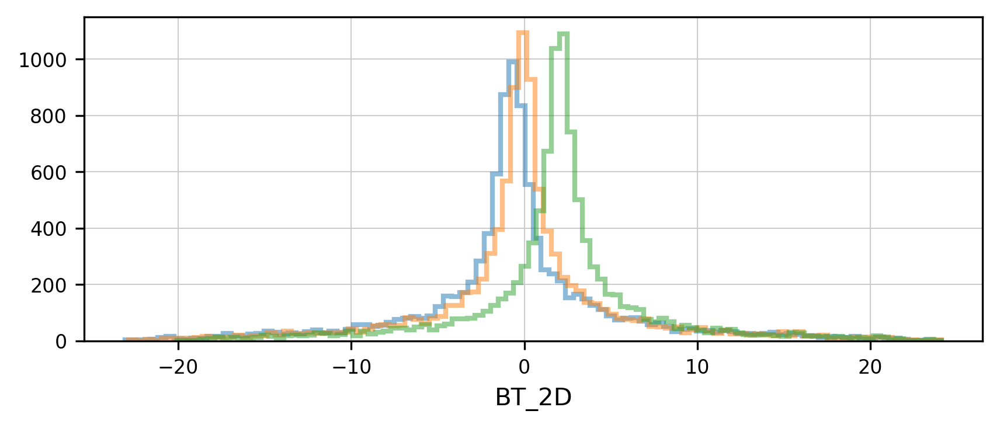

: 

In [154]:
delta.isel(band=1).plot.hist(bins=100, alpha=0.5, histtype='step', lw=2, color='C0')
delta.isel(band=3).plot.hist(bins=100, alpha=0.5, histtype='step', lw=2, color='C1')
delta.isel(band=4).plot.hist(bins=100, alpha=0.5, histtype='step', lw=2, color='C2')